### 


In [1]:
import pandas as pd
import numpy as np
from eliana.datasets import ParlogsObservations

In [2]:
INSTRUMENT='MATISSE'
RANGE='6m'

In [3]:
logs = ParlogsObservations(period=RANGE, source="Instrument", system=INSTRUMENT)

In [4]:
df_meta = logs.meta
df_traces = logs.traces()
TPL_IDs = logs.meta['TPL_ID'].value_counts()
print(TPL_IDs)

TPL_ID
MATISSE_hyb_obs                      1612
MATISSE_img_acq                      1467
MATISSE_gen_tec_opd                  1059
MATISSE_gen_cal_bias                  724
MATISSE_gen_cal_imbasic               399
MATISSE_gen_cal_transfunc             241
MATISSE_gen_tec_standby               199
MATISSE_gen_tec_ali                   185
MATISSE_gen_tec_check_fringes         183
MATISSE_img_acq_ft                    174
MATISSE_gen_tec_simple_rec            130
MATISSE_gen_cal_kappa                  56
MATISSE_gen_cal_shift                  50
CALOB_gen_tec_log                      37
errseverity                            33
MATISSE_gen_tec_setup_coude_train      27
MATISSE_gen_cal_det_aq                 22
MATISSE_gen_cal_det_h2                 21
MATISSE_gen_tec_piezos                 13
MATISSE_gen_tec_setup_lab               7
MATISSE_gen_cal_imext_aq                5
MATISSE_gen_cal_imrem_aq                3
MATISSE_gen_cal_imrem                   2
MATISSE_gen_cal_imext_h2   

In [5]:
TPL_IDs_Error=df_meta[df_meta['ERROR'] == True]
TPL_IDs_Error['TPL_ID'].value_counts()

TPL_ID
MATISSE_gen_tec_ali              67
MATISSE_hyb_obs                  43
MATISSE_img_acq                  39
errseverity                      27
MATISSE_img_acq_ft               23
MATISSE_gen_tec_opd              20
MATISSE_gen_cal_det_aq           15
MATISSE_gen_tec_check_fringes    10
MATISSE_gen_cal_bias              9
MATISSE_gen_cal_imbasic           6
MATISSE_gen_cal_det_h2            3
MATISSE_gen_cal_shift             3
MATISSE_gen_cal_kappa             2
MATISSE_gen_tec_piezos            2
MATISSE_gen_cal_transfunc         1
Name: count, dtype: int64

In [6]:
TPL = set(TPL_IDs.index) & set(TPL_IDs_Error['TPL_ID'])
print(TPL)

{'MATISSE_hyb_obs', 'MATISSE_gen_tec_piezos', 'MATISSE_gen_cal_det_aq', 'MATISSE_gen_tec_check_fringes', 'MATISSE_img_acq', 'MATISSE_gen_cal_kappa', 'MATISSE_gen_cal_bias', 'MATISSE_gen_cal_imbasic', 'errseverity', 'MATISSE_img_acq_ft', 'MATISSE_gen_cal_shift', 'MATISSE_gen_tec_opd', 'MATISSE_gen_tec_ali', 'MATISSE_gen_cal_det_h2', 'MATISSE_gen_cal_transfunc'}


In [7]:
df_meta['ERROR'].value_counts()

ERROR
False    6383
True      270
Name: count, dtype: int64

In [ ]:
def extract_params(df_original):
    # df is a copy fo df_original
    df = df_original.copy()
    
    # Filter rows where @timestamp are the first 3 seconds of the whole df
    df = df[df['@timestamp'] < df['@timestamp'].min() + pd.Timedelta(seconds=3)]
    
    # Filter where column logtext has the form (any string)' = '(anystring), and exactly one = sign
    df = df[df['logtext'].str.contains(r"^.* = .*$")] 
    
    # Create column "param" with left part of ' = ', and column "value" with right part of ' = '
    df['param'] = df['logtext'].str.split(' = ').str[0]
    df['value'] = df['logtext'].str.split(' = ').str[1]
    
    # Restrict to columns param and value
    df = df[['param', 'value']]
    
    # Replace spaces by dot in param
    df['param'] = df['param'].str.replace(" ", ".")

    # Remove extra ' enclosing value
    df['value'] = df['value'].str.replace("'", "")
    
    # Create a column numval with the numeric value of value, if possible, otherwise NaN
    df['numval'] = pd.to_numeric(df['value'], errors='coerce')
    
    # Create column strval if numval is NaN, otherwise empty string
    df['strval'] = df['value'].where(df['numval'].isna(), "")
    
    # Remove column value-
    df = df.drop(columns=['value']) 

    # Set param as the index
    df = df.set_index('param')

    df = df.sort_index()  
    return df


### Separar los dataframes en dos carpetas, una para los que no tienen errores y otra para los que tienen errores

In [9]:
df_meta_Error= df_meta[df_meta['ERROR'] == True]

In [10]:
df_meta_2 = df_meta[~df_meta['START'].isin(df_meta_Error['START'])]

### Funciones:
* Funcion para extraer los parametros
* Funcion para graficar los parametros

In [11]:
import matplotlib.pyplot as plt
plt.style.use('default')
plt.rcParams['font.size'] = 10

def graficos_dispersion_por_columna(df_sin_error, df_con_error):
    columnas_parametros = [col for col in df_sin_error.columns if col != 'param']

    print(f"Creando gráficos para {len(columnas_parametros)} parámetros...")
    print(f"Observaciones sin error: {len(df_sin_error)}")
    print(f"Observaciones con error: {len(df_con_error)}")

    n_params = len(columnas_parametros)
    cols = 3
    rows = (n_params + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    fig.suptitle('Dispersión de Parámetros\nRojo: Sin Error | Azul: Con Error', 
                 fontsize=18, fontweight='bold', y=0.995)

    if rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)

    axes_flat = axes.flatten()

    for i, param in enumerate(columnas_parametros):
        ax = axes_flat[i]
        x_sin_error = range(len(df_sin_error))
        x_con_error = range(len(df_con_error))
        y_sin_error = df_sin_error[param]
        y_con_error = df_con_error[param]

        ax.scatter(x_sin_error, y_sin_error, c='red', alpha=0.6, s=20,
                   label=f'Sin error (n={len(df_sin_error)})', edgecolors='darkred', linewidth=0.3)

        ax.scatter(x_con_error, y_con_error, c='blue', alpha=0.6, s=20,
                   label=f'Con error (n={len(df_con_error)})', edgecolors='darkblue', linewidth=0.3)

        ax.set_title(param, fontweight='bold', fontsize=11)
        ax.set_xlabel('Índice de Observación')
        ax.set_ylabel('Valor del Parámetro')
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)

        # Resaltar si todos los valores son constantes
        if y_sin_error.std() == 0 and y_con_error.std() == 0:
            ax.text(0.5, 0.5, 'VALORES\nCONSTANTES', transform=ax.transAxes,
                    ha='center', va='center', fontsize=12, fontweight='bold',
                    bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.7))

    for i in range(len(columnas_parametros), len(axes_flat)):
        axes_flat[i].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


In [ ]:
def graficos_dispersion_ordenados_por_valor(df_sin_error, df_con_error):
    """
    Crea gráficos de dispersión donde las observaciones están ordenadas por valor
    para mejor visualización de la distribución
    """
    
    # Obtener las columnas de parámetros
    columnas_parametros = [col for col in df_sin_error.columns if col != 'param']
    
    # Filtrar solo parámetros con variabilidad
    params_variables = []
    for col in columnas_parametros:
        if df_sin_error[col].std() > 0 or df_con_error[col].std() > 0:
            params_variables.append(col)
    
    if not params_variables:
        print("No se encontraron parámetros con variabilidad para graficar.")
        return
    
    print(f"Creando gráficos ordenados para {len(params_variables)} parámetros variables...")
    
    # Calcular número de subplots
    n_params = len(params_variables)
    cols = 2  # 2 columnas por fila para gráficos más grandes
    rows = (n_params + cols - 1) // cols
    
    # Crear figura
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4*rows))
    fig.suptitle('Gráficos de Dispersión Ordenados por Valor\nSin Error (Rojo) vs Con Error (Azul)', 
                 fontsize=16, fontweight='bold')
    
    # Asegurar que axes sea iterable
    if n_params == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes if isinstance(axes, np.ndarray) else [axes]
    else:
        axes = axes.flatten()
    
    for i, param in enumerate(params_variables):
        ax = axes[i]
        
        # Obtener y ordenar los datos
        sin_error_sorted = df_sin_error[param].sort_values().reset_index(drop=True)
        con_error_sorted = df_con_error[param].sort_values().reset_index(drop=True)
        
        # Crear índices
        x_sin_error = range(len(sin_error_sorted))
        x_con_error = range(len(con_error_sorted))
        
        # Gráfico de dispersión
        ax.scatter(x_sin_error, sin_error_sorted, c='red', alpha=0.7, s=25, 
                  label=f'Sin error (n={len(sin_error_sorted)})', 
                  edgecolors='darkred', linewidth=0.5)
        
        ax.scatter(x_con_error, con_error_sorted, c='blue', alpha=0.7, s=25, 
                  label=f'Con error (n={len(con_error_sorted)})', 
                  edgecolors='darkblue', linewidth=0.5)
        
        # Configurar el subplot
        ax.set_title(f'{param} (Ordenado por Valor)', fontweight='bold')
        ax.set_xlabel('Índice Ordenado')
        ax.set_ylabel('Valor del Parámetro')
        ax.grid(True, alpha=0.3)
        ax.legend()
        
        # Añadir líneas de tendencia si hay suficientes datos
        if len(sin_error_sorted) > 1:
            ax.plot(x_sin_error, sin_error_sorted, 'red', alpha=0.3, linewidth=1)
        if len(con_error_sorted) > 1:
            ax.plot(x_con_error, con_error_sorted, 'blue', alpha=0.3, linewidth=1)
        
        # Estadísticas
        stats_text = (f'Sin Error: {sin_error_sorted.min():.3f} - {sin_error_sorted.max():.3f}\n'
                     f'Con Error: {con_error_sorted.min():.3f} - {con_error_sorted.max():.3f}')
        
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
               verticalalignment='top', fontsize=8,
               bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    
    # Ocultar subplots vacíos
    for i in range(len(params_variables), len(axes)):
        axes[i].set_visible(False)
    
    plt.tight_layout()
    plt.show()


In [13]:
import pandas as pd

def extract_trace_parameters(df_meta, df_traces, extract_params, tpl_id='MATISSE_img_acq'):
    """
    Extrae parámetros numéricos de trazas de un DataFrame de trazas filtrado por un TPL_ID específico.

    Args:
        df_meta (pd.DataFrame): DataFrame que contiene información de metadatos con columna 'TPL_ID'.
        df_traces (pd.DataFrame): DataFrame que contiene las trazas, con columna 'trace_id'.
        extract_params (function): Función que toma un DataFrame de una traza y devuelve un DataFrame con parámetros.
        tpl_id (str): Valor de TPL_ID por el cual se desea filtrar (por defecto 'MATISSE_img_acq').

    Returns:
        pd.DataFrame: DataFrame con los parámetros numéricos extraídos por cada trace_id.
    """
    # Indices de los trace_id que coinciden con el TPL_ID especificado
    tpl_indices = df_meta[df_meta['TPL_ID'] == tpl_id].index

    # Filtrar df_traces usando los trace_id anteriores
    df_filtered = df_traces[df_traces['trace_id'].isin(tpl_indices)]

    # Extraer parámetros
    params_dict = {}
    for trace_id in df_filtered['trace_id'].unique():
        df_trace = df_filtered[df_filtered['trace_id'] == trace_id]
        params = extract_params(df_trace)

        # Eliminar duplicados de índice
        params = params[~params.index.duplicated(keep='first')]
        params_dict[trace_id] = params

    params_df = pd.concat(
        {trace_id: df['numval'] for trace_id, df in params_dict.items()},
        axis=1).T

    params_df = params_df.sort_index(axis=1)

    params_df = params_df.dropna(how='all')        
    params_df = params_df.dropna(axis=1, how='all') 

    return params_df


In [14]:
params_df = extract_trace_parameters(df_meta, df_traces, extract_params, tpl_id='MATISSE_hyb_obs')


In [15]:
params_df.describe()

param,COU.AG.ALPHA,COU.AG.DELTA,COU.AG.EPOCH,COU.AG.EQUINOX,COU.AG.PMA,COU.AG.PMD,COU.GS.MAG,DEL.REF.NAME,DEL.REF.OPL,DET1.APOTYPE.VAL,...,TEL.GS1.ALPHA,TEL.GS1.DELTA,TEL.GS1.MAG,TEL.TARG.ADDVELALPHA,TEL.TARG.ADDVELDELTA,TEL.TARG.ALPHA,TEL.TARG.DELTA,TEL.TARG.EQUINOX,TEL.TARG.PMA,TEL.TARG.PMD
count,14.0,14.0,14.0,14.0,14.0,14.0,14.000000,12.0,14.0,1612.0,...,14.0,14.0,14.0,14.0,14.0,14.000000,14.000000,14.0,14.000000,14.000000
mean,0.0,0.0,2000.0,2000.0,0.0,0.0,4.007143,1.0,30.0,0.0,...,0.0,0.0,12.0,0.0,0.0,110064.188571,-142529.225714,2000.0,17.832726,-0.025145
std,0.0,0.0,0.0,0.0,0.0,0.0,2.423114,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,26747.287665,249227.511657,0.0,66.822380,0.069225
min,0.0,0.0,2000.0,2000.0,0.0,0.0,0.000000,1.0,30.0,0.0,...,0.0,0.0,12.0,0.0,0.0,21920.790000,-602404.129000,2000.0,-0.278800,-0.237000
25%,0.0,0.0,2000.0,2000.0,0.0,0.0,3.000000,1.0,30.0,0.0,...,0.0,0.0,12.0,0.0,0.0,110149.674000,-343959.850000,2000.0,-0.014807,-0.035560
50%,0.0,0.0,2000.0,2000.0,0.0,0.0,4.800000,1.0,30.0,0.0,...,0.0,0.0,12.0,0.0,0.0,115485.598000,-22904.501000,2000.0,0.000690,-0.009060
75%,0.0,0.0,2000.0,2000.0,0.0,0.0,6.000000,1.0,30.0,0.0,...,0.0,0.0,12.0,0.0,0.0,124093.959750,19340.203000,2000.0,0.009760,-0.002125
max,0.0,0.0,2000.0,2000.0,0.0,0.0,6.500000,1.0,30.0,0.0,...,0.0,0.0,12.0,0.0,0.0,130210.597000,105732.941000,2000.0,250.000000,0.091670


### Extracción de parámetros numéricos de las trazas

In [25]:
import os

output_dir = "params_por_tpl"
os.makedirs(output_dir, exist_ok=True)

tpl_params_dict = {}

for tpl_id in TPL:
    print(f"Procesando TPL_ID: {tpl_id}")
    
    # Extraer parámetros
    params_df = extract_trace_parameters(df_meta_2, df_traces, extract_params, tpl_id=tpl_id)
    
    # Filtrar columnas con más del 50% de NaN
    threshold = 0.5
    params_df = params_df.loc[:, params_df.isna().mean() < threshold]
    # Filtrar filas con >50% NaN
    params_df = params_df.loc[params_df.isna().mean(axis=1) < threshold, :]

    # Solo guardar si hay datos válidos
    if not params_df.empty:
        tpl_params_dict[tpl_id] = params_df
        safe_tpl_id = str(tpl_id).replace("/", "_").replace(" ", "_")
        filename = os.path.join(output_dir, f"params_{safe_tpl_id}.csv")

        params_df.to_csv(filename)
        print(f"Guardado: {filename}")
    else:
        print(f"No se guardó {tpl_id} porque el DataFrame está vacío después del filtrado.")


Procesando TPL_ID: MATISSE_hyb_obs
Guardado: params_por_tpl\params_MATISSE_hyb_obs.csv
Procesando TPL_ID: MATISSE_gen_tec_piezos
Guardado: params_por_tpl\params_MATISSE_gen_tec_piezos.csv
Procesando TPL_ID: MATISSE_gen_cal_det_aq
Guardado: params_por_tpl\params_MATISSE_gen_cal_det_aq.csv
Procesando TPL_ID: MATISSE_gen_tec_check_fringes
Guardado: params_por_tpl\params_MATISSE_gen_tec_check_fringes.csv
Procesando TPL_ID: MATISSE_img_acq
Guardado: params_por_tpl\params_MATISSE_img_acq.csv
Procesando TPL_ID: MATISSE_gen_cal_kappa
Guardado: params_por_tpl\params_MATISSE_gen_cal_kappa.csv
Procesando TPL_ID: MATISSE_gen_cal_bias
Guardado: params_por_tpl\params_MATISSE_gen_cal_bias.csv
Procesando TPL_ID: MATISSE_gen_cal_imbasic
Guardado: params_por_tpl\params_MATISSE_gen_cal_imbasic.csv
Procesando TPL_ID: errseverity
Guardado: params_por_tpl\params_errseverity.csv
Procesando TPL_ID: MATISSE_img_acq_ft
Guardado: params_por_tpl\params_MATISSE_img_acq_ft.csv
Procesando TPL_ID: MATISSE_gen_cal_shi

In [24]:
import os

output_dir = "params_por_tpl_Error"

os.makedirs(output_dir, exist_ok=True)

tpl_params_dict = {}

for tpl_id in TPL:
    print(f"Procesando TPL_ID: {tpl_id}")
    
    # Extraer parámetros
    params_df = extract_trace_parameters(df_meta_Error, df_traces, extract_params, tpl_id=tpl_id)
    
    # Filtrar columnas con más del 50% de NaN
    threshold = 0.5
    params_df = params_df.loc[:, params_df.isna().mean() < threshold]
    # Filtrar filas con >50% NaN
    params_df = params_df.loc[params_df.isna().mean(axis=1) < threshold, :]

    # Solo guardar si hay datos válidos
    if not params_df.empty:
        tpl_params_dict[tpl_id] = params_df
        
        # Nombre seguro para archivo
        safe_tpl_id = str(tpl_id).replace("/", "_").replace(" ", "_")
        filename = os.path.join(output_dir, f"params_{safe_tpl_id}.csv")

        params_df.to_csv(filename)
        print(f"Guardado: {filename}")
    else:
        print(f"No se guardó {tpl_id} porque el DataFrame está vacío después del filtrado.")


Procesando TPL_ID: MATISSE_hyb_obs
Guardado: params_por_tpl_Error\params_MATISSE_hyb_obs.csv
Procesando TPL_ID: MATISSE_gen_tec_piezos
Guardado: params_por_tpl_Error\params_MATISSE_gen_tec_piezos.csv
Procesando TPL_ID: MATISSE_gen_cal_det_aq
Guardado: params_por_tpl_Error\params_MATISSE_gen_cal_det_aq.csv
Procesando TPL_ID: MATISSE_gen_tec_check_fringes
Guardado: params_por_tpl_Error\params_MATISSE_gen_tec_check_fringes.csv
Procesando TPL_ID: MATISSE_img_acq
Guardado: params_por_tpl_Error\params_MATISSE_img_acq.csv
Procesando TPL_ID: MATISSE_gen_cal_kappa
Guardado: params_por_tpl_Error\params_MATISSE_gen_cal_kappa.csv
Procesando TPL_ID: MATISSE_gen_cal_bias
Guardado: params_por_tpl_Error\params_MATISSE_gen_cal_bias.csv
Procesando TPL_ID: MATISSE_gen_cal_imbasic
Guardado: params_por_tpl_Error\params_MATISSE_gen_cal_imbasic.csv
Procesando TPL_ID: errseverity
Guardado: params_por_tpl_Error\params_errseverity.csv
Procesando TPL_ID: MATISSE_img_acq_ft
Guardado: params_por_tpl_Error\params_M

In [26]:
import os
import pandas as pd


input_dirs = ["params_por_tpl", "params_por_tpl_Error"]

for input_dir in input_dirs:
    print(f"\n Leyendo archivos desde: {input_dir}")

    for filename in os.listdir(input_dir):
        if filename.endswith(".csv"):
            file_path = os.path.join(input_dir, filename)
            df = pd.read_csv(file_path, index_col=0)

            print("\n" + "="*100)
            print(f" Descripción de: {filename}")
            print("="*100)

            desc = df.select_dtypes(include='number').describe().T.round(2) 
            print(desc)




 Leyendo archivos desde: params_por_tpl

 Descripción de: params_errseverity.csv
                      count    mean   std     min     25%     50%     75%  \
DET1.APOTYPE.VAL        4.0    0.00  0.00    0.00    0.00    0.00    0.00   
DET1.APOX.VAL           4.0  512.00  0.00  512.00  512.00  512.00  512.00   
DET1.APOY.VAL           4.0  512.00  0.00  512.00  512.00  512.00  512.00   
DET1.DIT                4.0    0.32  0.36    0.02    0.02    0.26    0.56   
DET1.INTERFX.VAL        4.0  512.00  0.00  512.00  512.00  512.00  512.00   
DET1.INTERFY.VAL        4.0  512.00  0.00  512.00  512.00  512.00  512.00   
DET1.NCOHERENT.VAL      4.0    1.00  0.00    1.00    1.00    1.00    1.00   
DET1.NDIT               4.0   40.00  0.00   40.00   40.00   40.00   40.00   
DET1.NINCOHERENT.VAL    4.0    1.00  0.00    1.00    1.00    1.00    1.00   
DET1.SNRLIMIT.VAL       4.0    5.00  0.00    5.00    5.00    5.00    5.00   
DET1.WLMAXCUT.VAL       4.0    4.80  0.00    4.80    4.80    4.80    4.


Comparando params_errseverity.csv
Creando gráficos para 27 parámetros...
Observaciones sin error: 4
Observaciones con error: 26


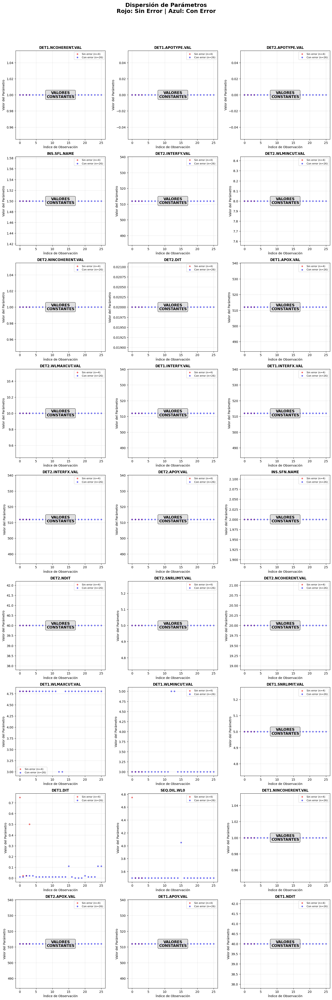


Comparando params_MATISSE_gen_cal_bias.csv
Creando gráficos para 3 parámetros...
Observaciones sin error: 715
Observaciones con error: 9


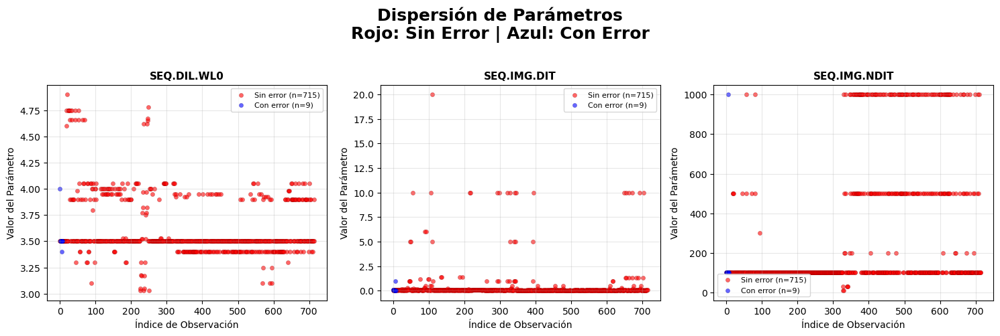


Comparando params_MATISSE_gen_cal_det_aq.csv
Creando gráficos para 12 parámetros...
Observaciones sin error: 7
Observaciones con error: 15


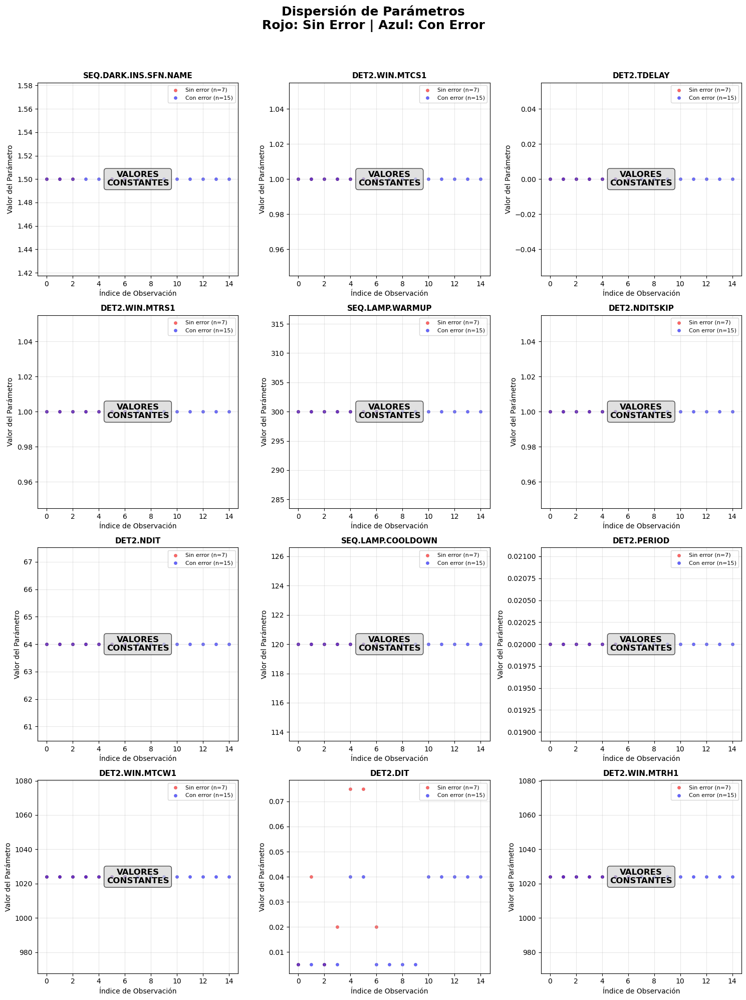


Comparando params_MATISSE_gen_cal_det_h2.csv
Creando gráficos para 13 parámetros...
Observaciones sin error: 18
Observaciones con error: 3


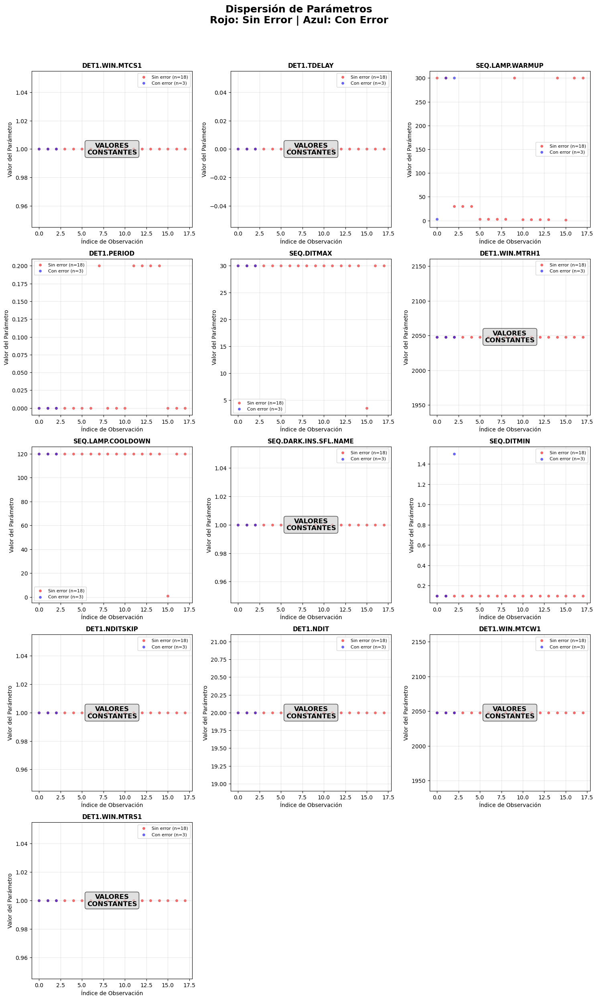


Comparando params_MATISSE_gen_cal_imbasic.csv
Creando gráficos para 21 parámetros...
Observaciones sin error: 393
Observaciones con error: 6


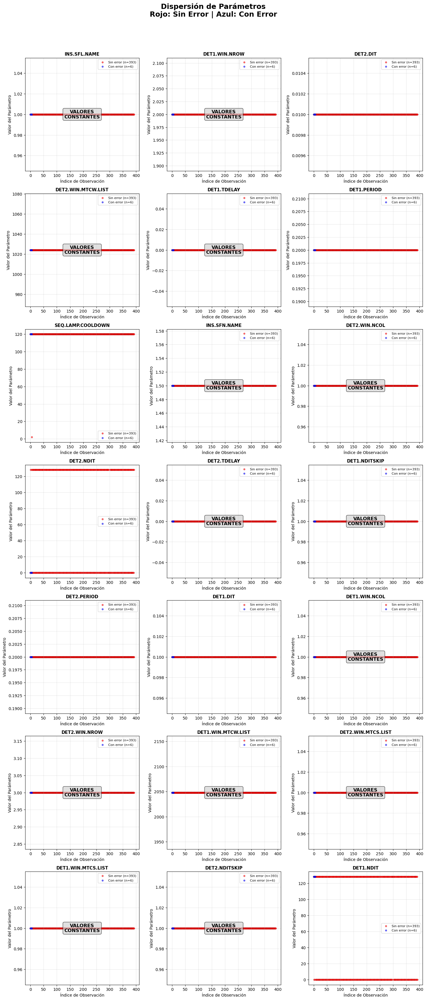


Comparando params_MATISSE_gen_cal_kappa.csv
Creando gráficos para 4 parámetros...
Observaciones sin error: 54
Observaciones con error: 2


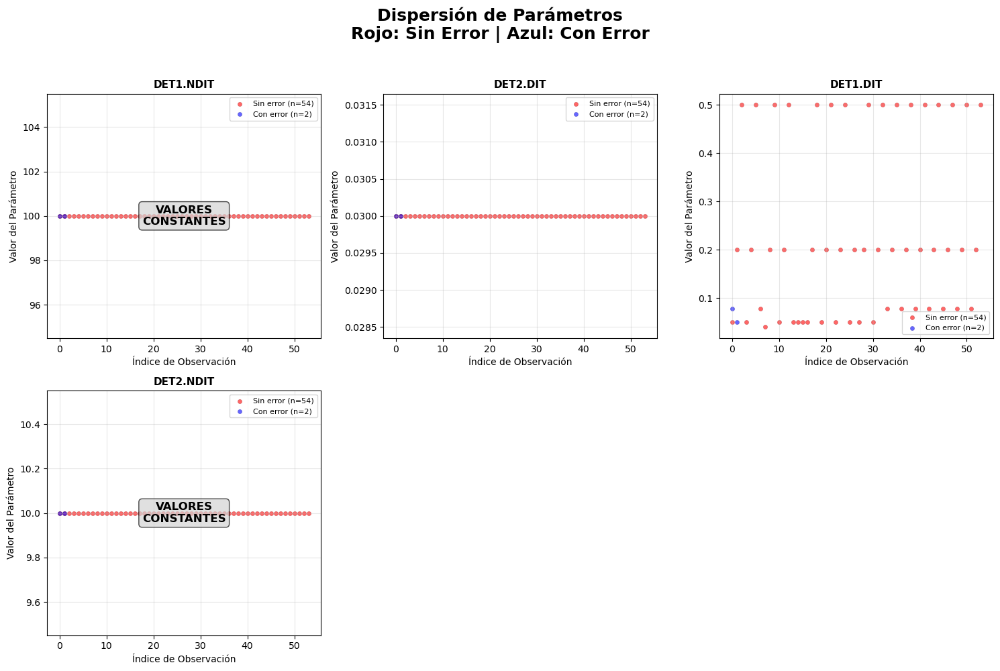


Comparando params_MATISSE_gen_cal_shift.csv
Creando gráficos para 4 parámetros...
Observaciones sin error: 47
Observaciones con error: 3


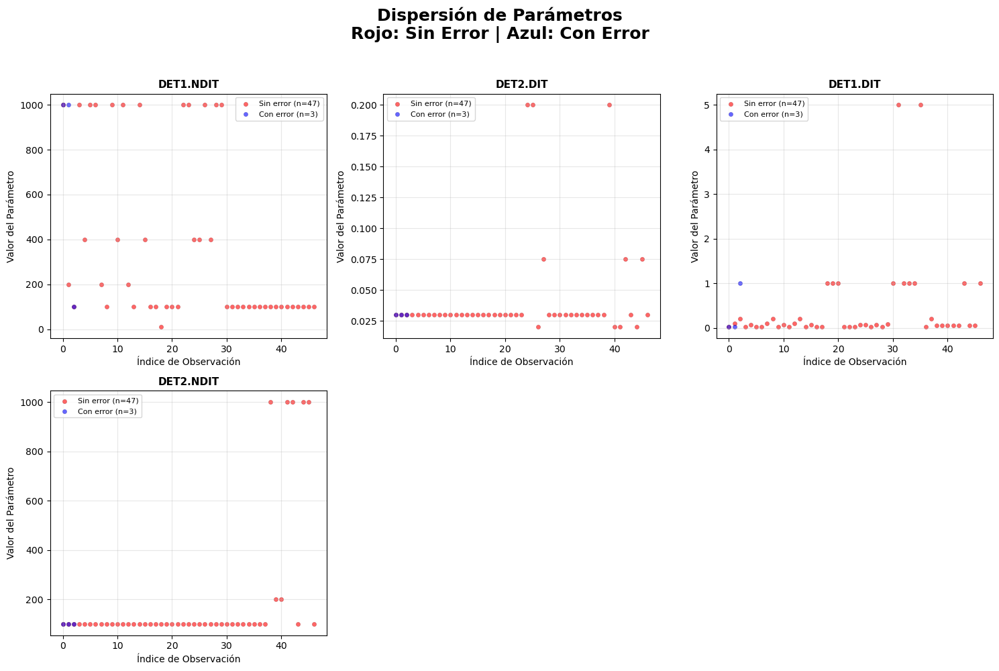


Comparando params_MATISSE_gen_cal_transfunc.csv
Creando gráficos para 37 parámetros...
Observaciones sin error: 240
Observaciones con error: 1


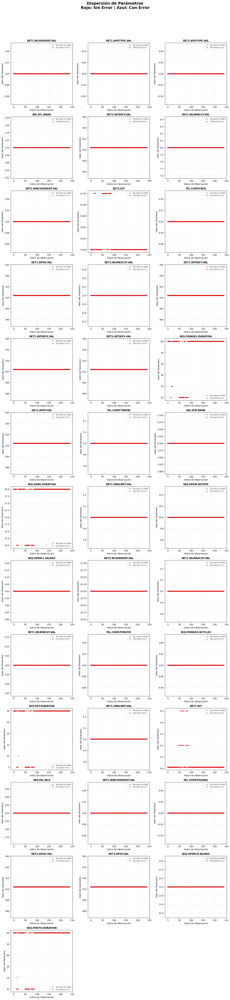


Comparando params_MATISSE_gen_tec_ali.csv
Creando gráficos para 8 parámetros...
Observaciones sin error: 116
Observaciones con error: 67


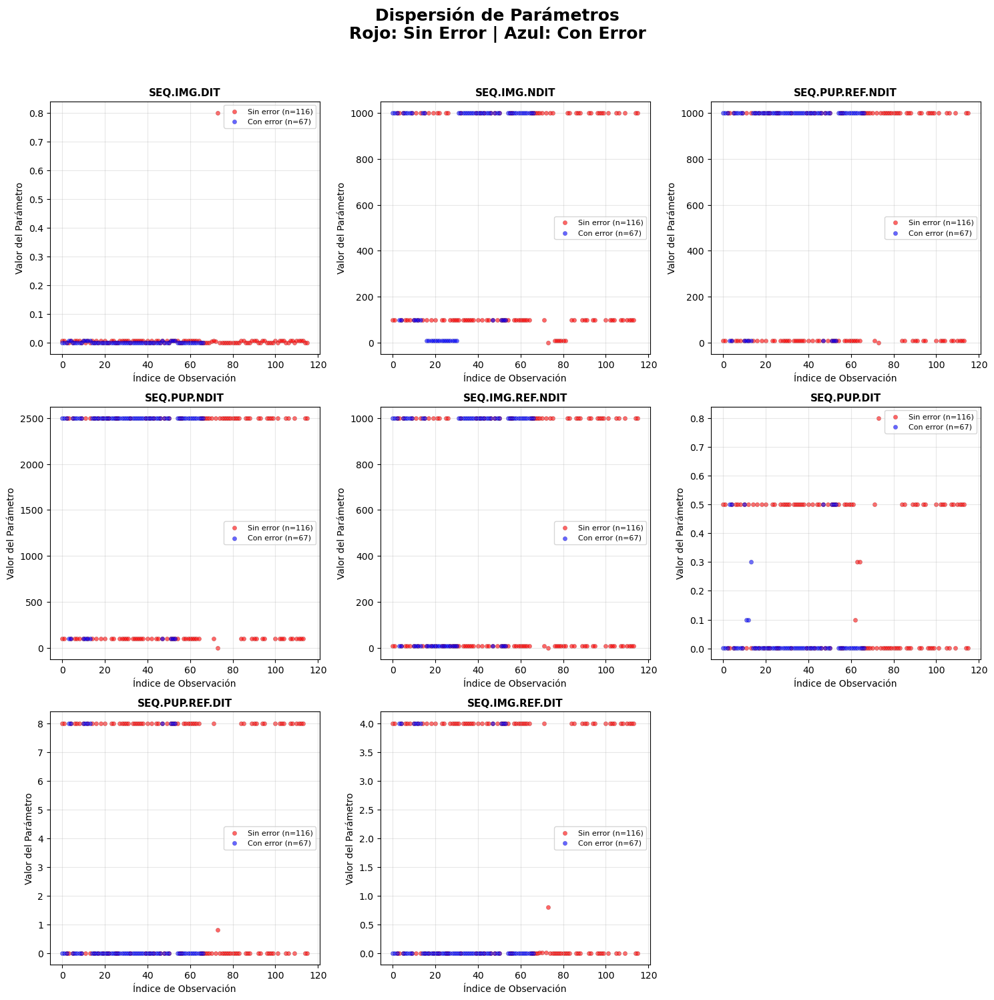


Comparando params_MATISSE_gen_tec_check_fringes.csv
Creando gráficos para 27 parámetros...
Observaciones sin error: 173
Observaciones con error: 10


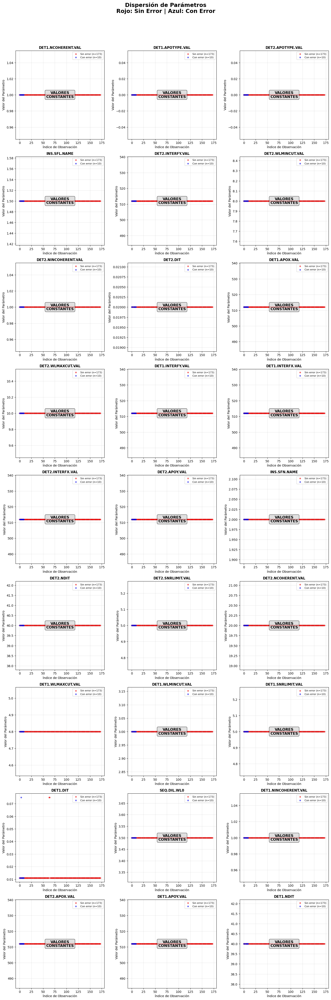


Comparando params_MATISSE_gen_tec_opd.csv
Creando gráficos para 26 parámetros...
Observaciones sin error: 1035
Observaciones con error: 20


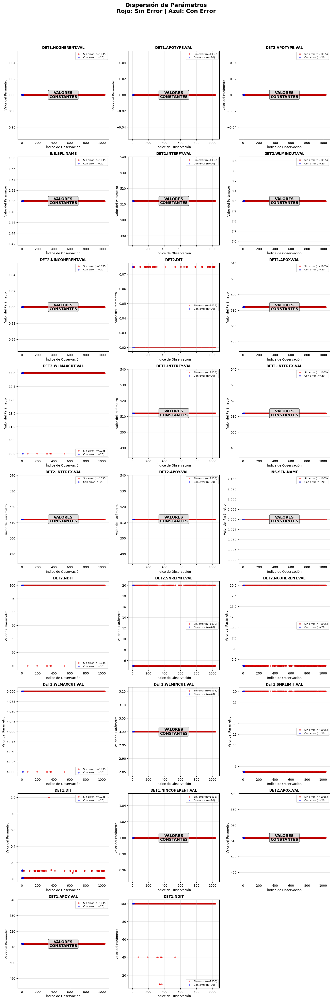


Comparando params_MATISSE_gen_tec_piezos.csv
Creando gráficos para 9 parámetros...
Observaciones sin error: 11
Observaciones con error: 2


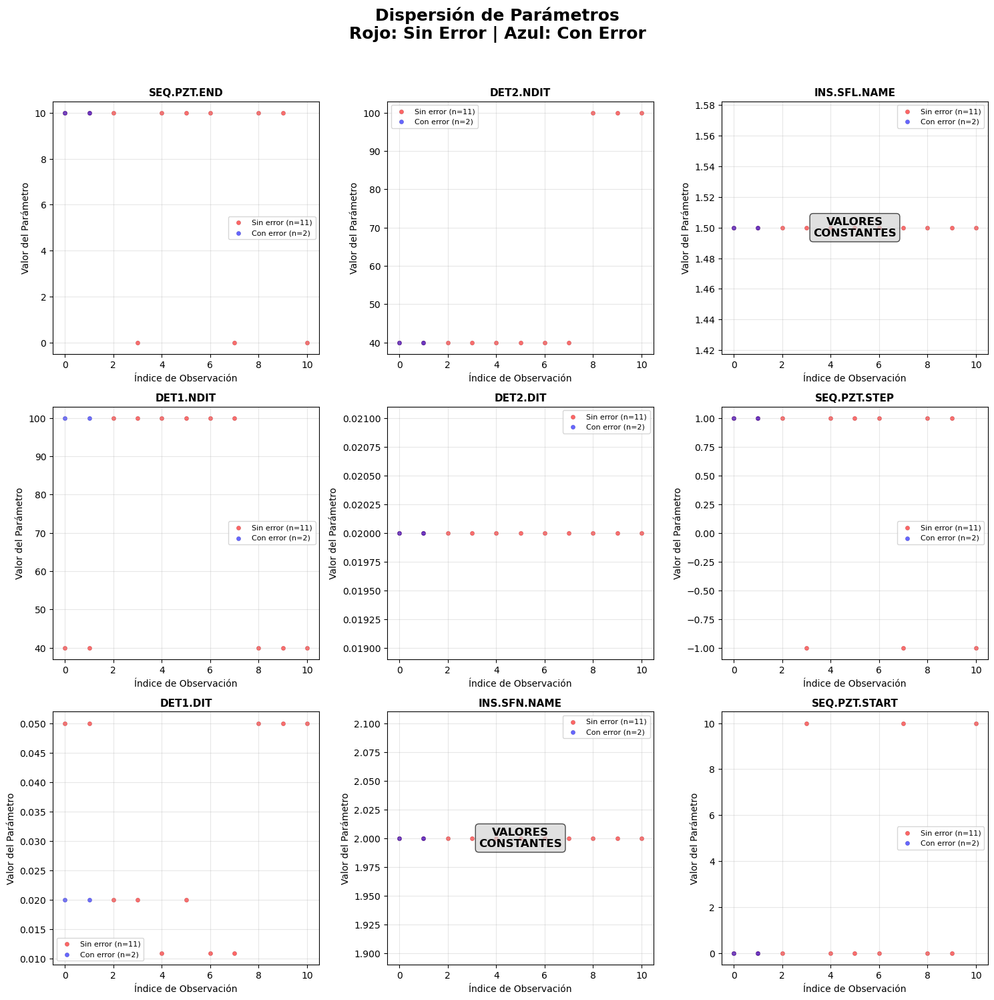


Comparando params_MATISSE_hyb_obs.csv
Creando gráficos para 36 parámetros...
Observaciones sin error: 1569
Observaciones con error: 43


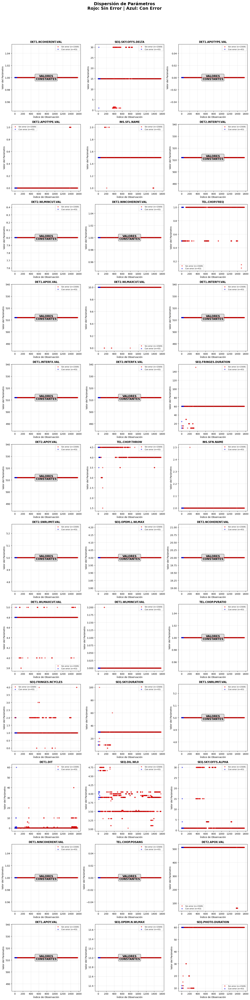


Comparando params_MATISSE_img_acq.csv
Creando gráficos para 62 parámetros...
Observaciones sin error: 1425
Observaciones con error: 38


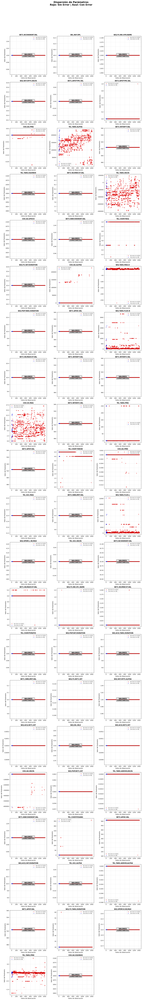


Comparando params_MATISSE_img_acq_ft.csv
Creando gráficos para 60 parámetros...
Observaciones sin error: 149
Observaciones con error: 21


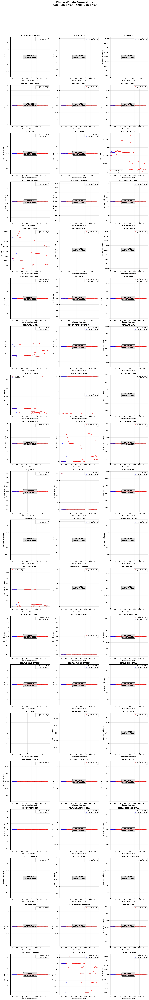

In [27]:
import os
import pandas as pd

dir_ok = "params_por_tpl"
dir_err = "params_por_tpl_Error"

for filename in os.listdir(dir_ok):
    if filename.endswith(".csv"):
        path_ok = os.path.join(dir_ok, filename)
        path_err = os.path.join(dir_err, filename)

        if os.path.exists(path_err):
            print(f"\nComparando {filename}")

            df_ok = pd.read_csv(path_ok, index_col=0)
            df_err = pd.read_csv(path_err, index_col=0)
            columns = list(set(df_ok.columns) & set(df_err.columns))
            df_ok = df_ok[columns]
            df_err = df_err[columns]
            graficos_dispersion_por_columna(df_ok, df_err)
        else:
            print(f"Archivo no encontrado en errores: {filename}")



📊 Comparando: params_errseverity.csv
Creando gráficos ordenados para 4 parámetros variables...


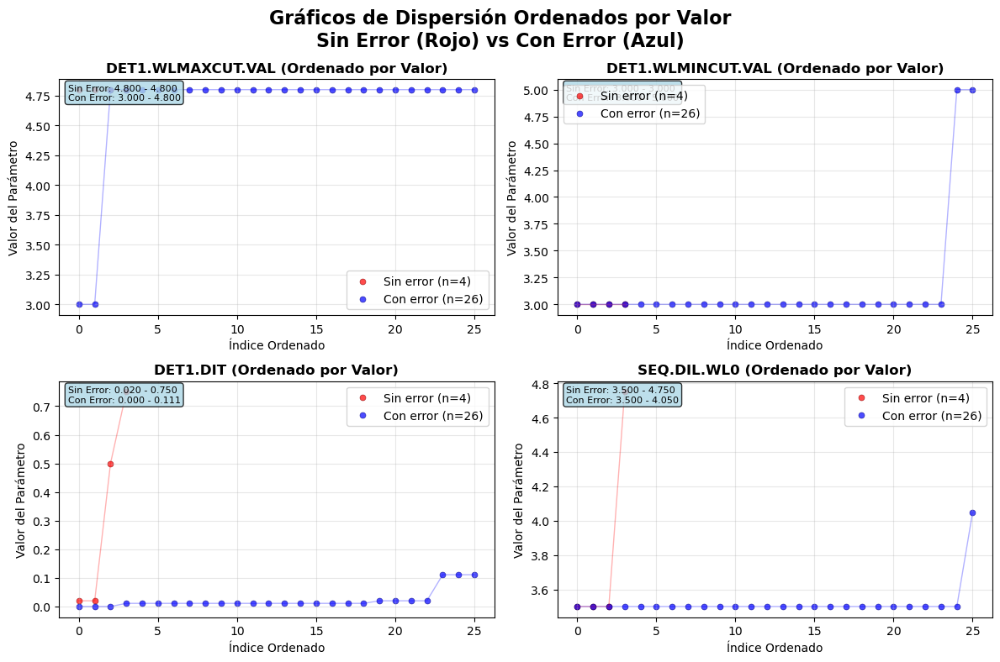


📊 Comparando: params_MATISSE_gen_cal_bias.csv
Creando gráficos ordenados para 3 parámetros variables...


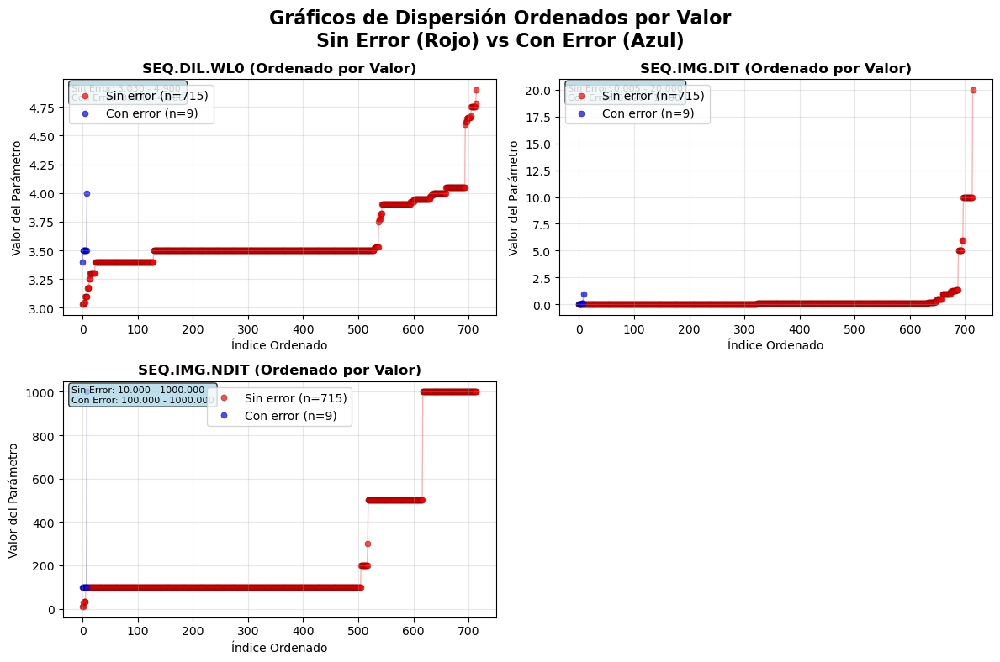


📊 Comparando: params_MATISSE_gen_cal_det_aq.csv
Creando gráficos ordenados para 1 parámetros variables...
❌ Error al procesar params_MATISSE_gen_cal_det_aq.csv: 'numpy.ndarray' object has no attribute 'scatter'

📊 Comparando: params_MATISSE_gen_cal_det_h2.csv
Creando gráficos ordenados para 5 parámetros variables...


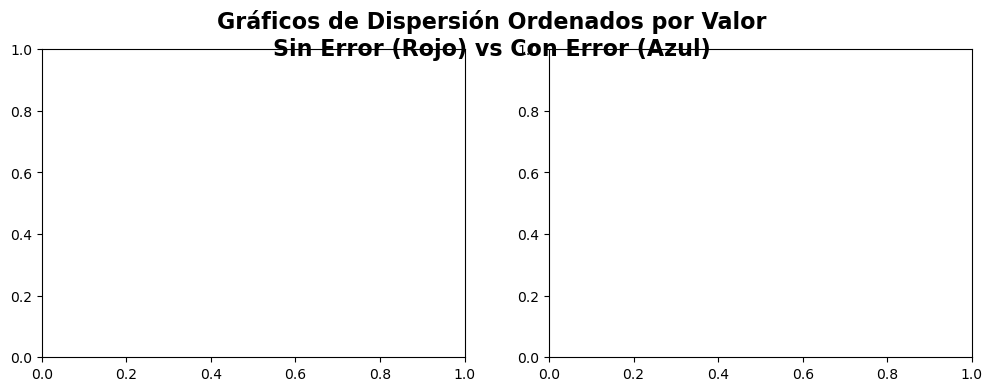

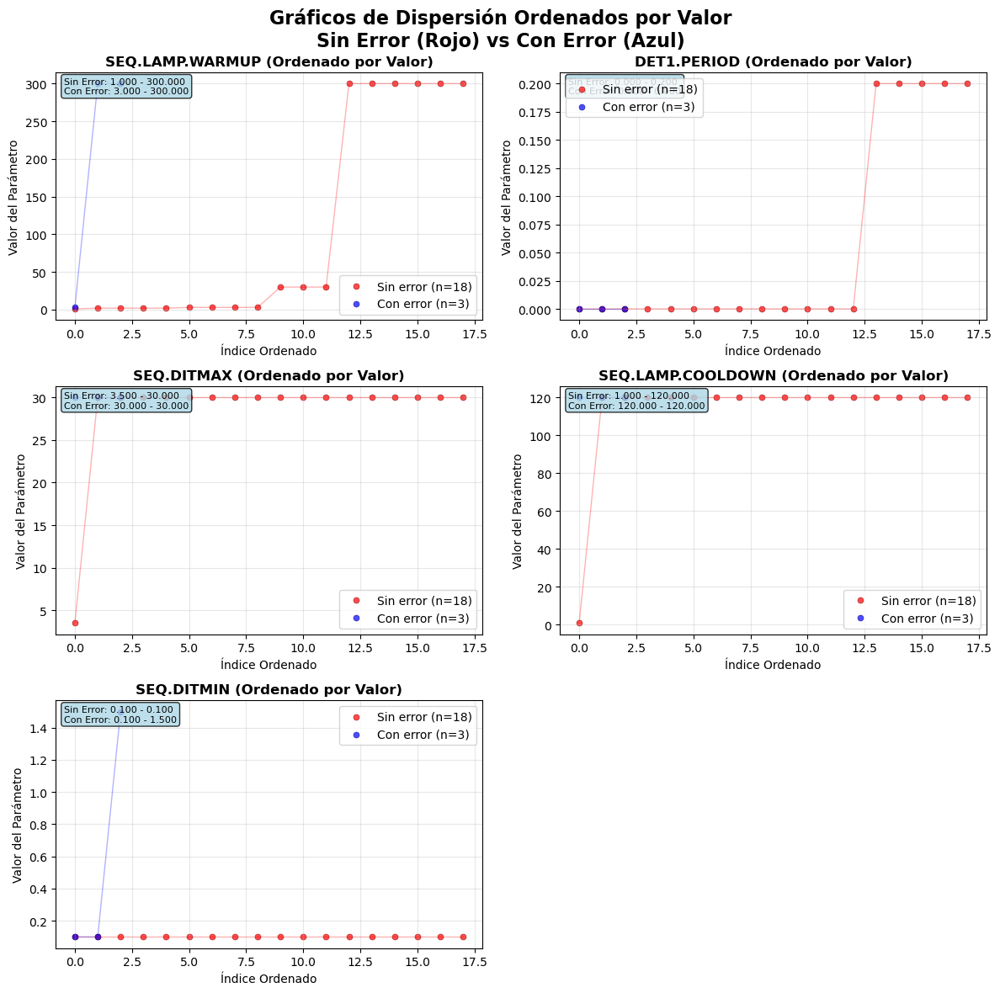


📊 Comparando: params_MATISSE_gen_cal_imbasic.csv
Creando gráficos ordenados para 7 parámetros variables...


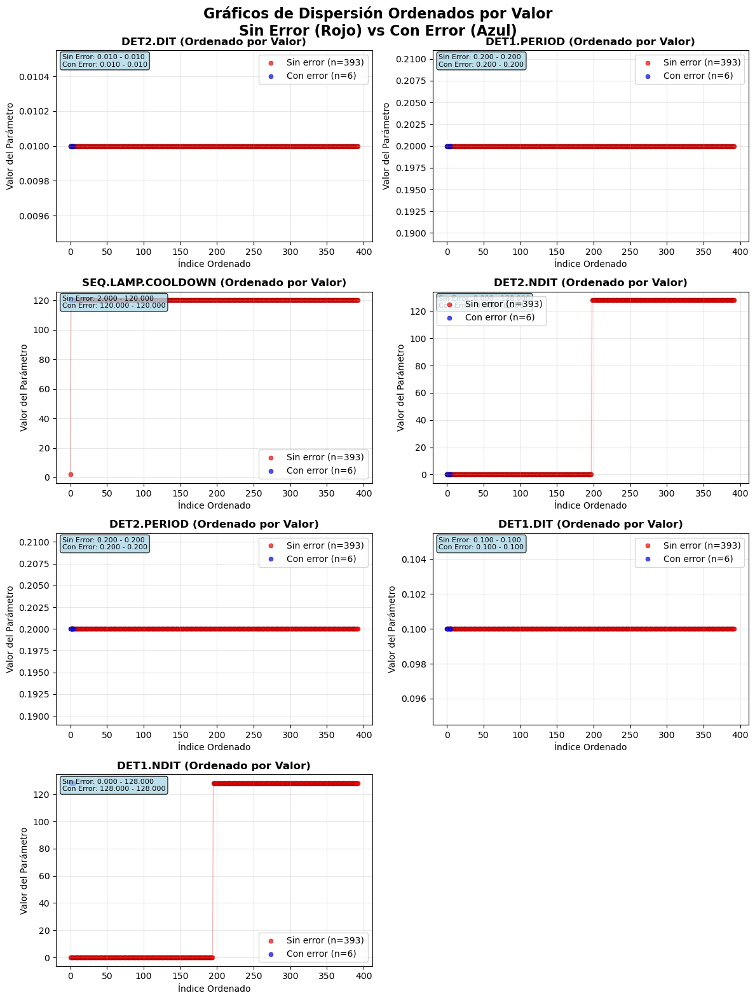


📊 Comparando: params_MATISSE_gen_cal_kappa.csv
Creando gráficos ordenados para 2 parámetros variables...


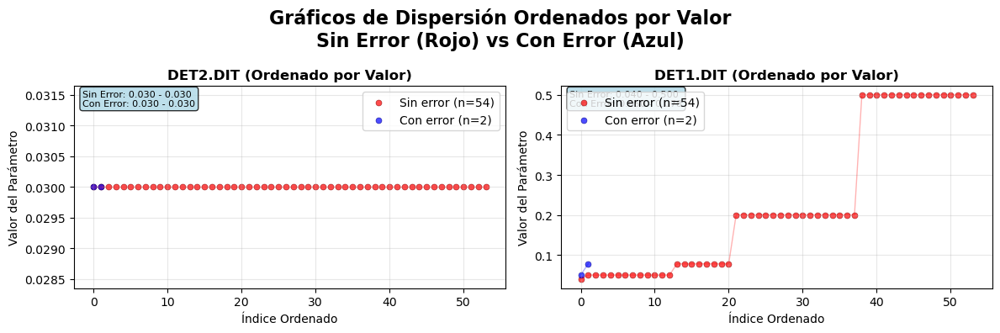


📊 Comparando: params_MATISSE_gen_cal_shift.csv
Creando gráficos ordenados para 4 parámetros variables...


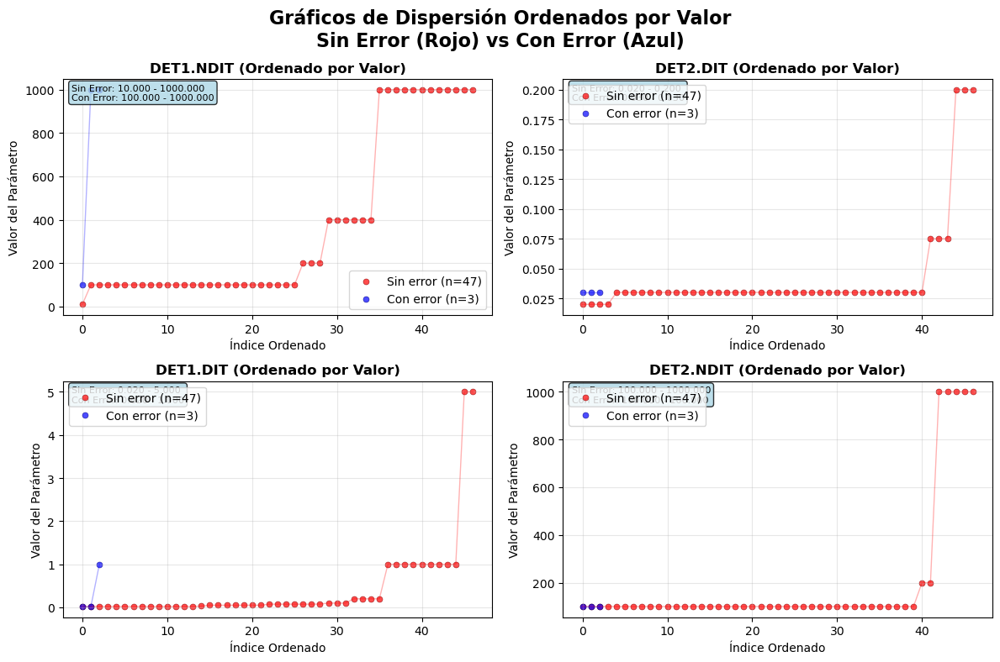


📊 Comparando: params_MATISSE_gen_cal_transfunc.csv
Creando gráficos ordenados para 6 parámetros variables...


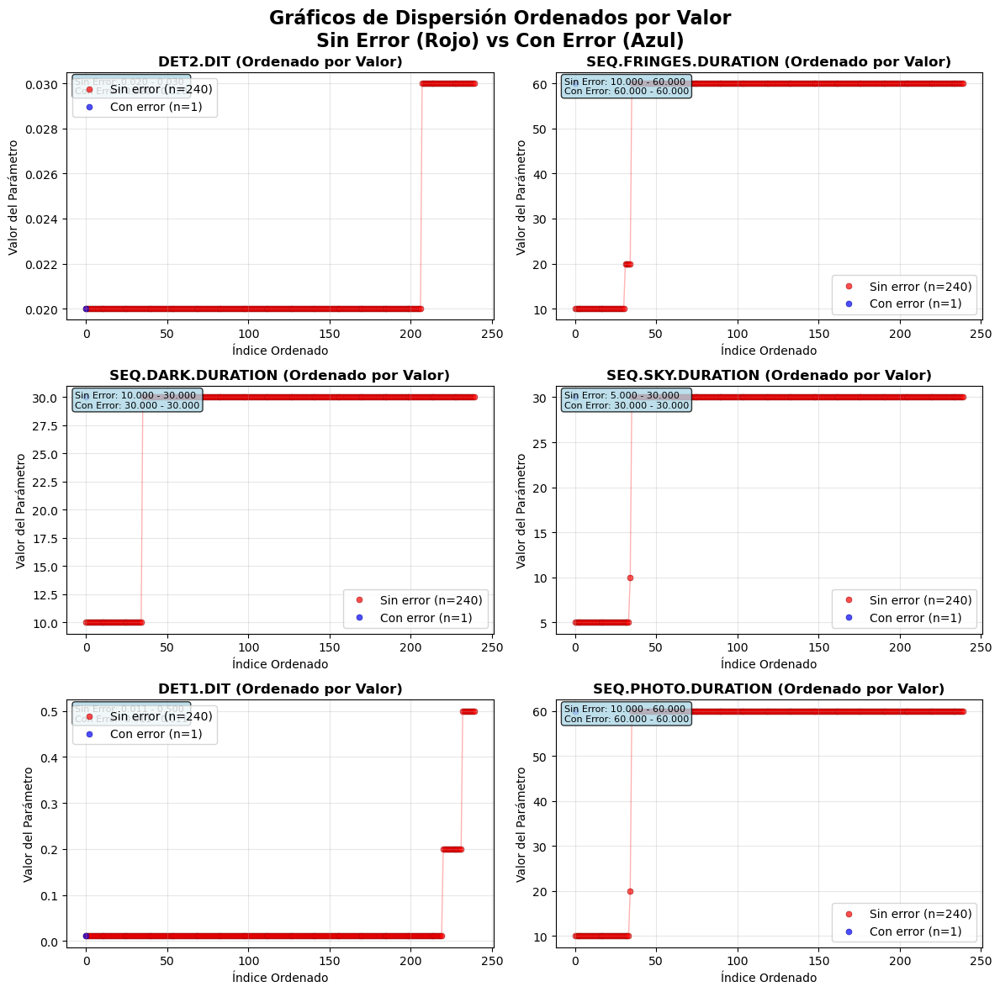


📊 Comparando: params_MATISSE_gen_tec_ali.csv
Creando gráficos ordenados para 8 parámetros variables...


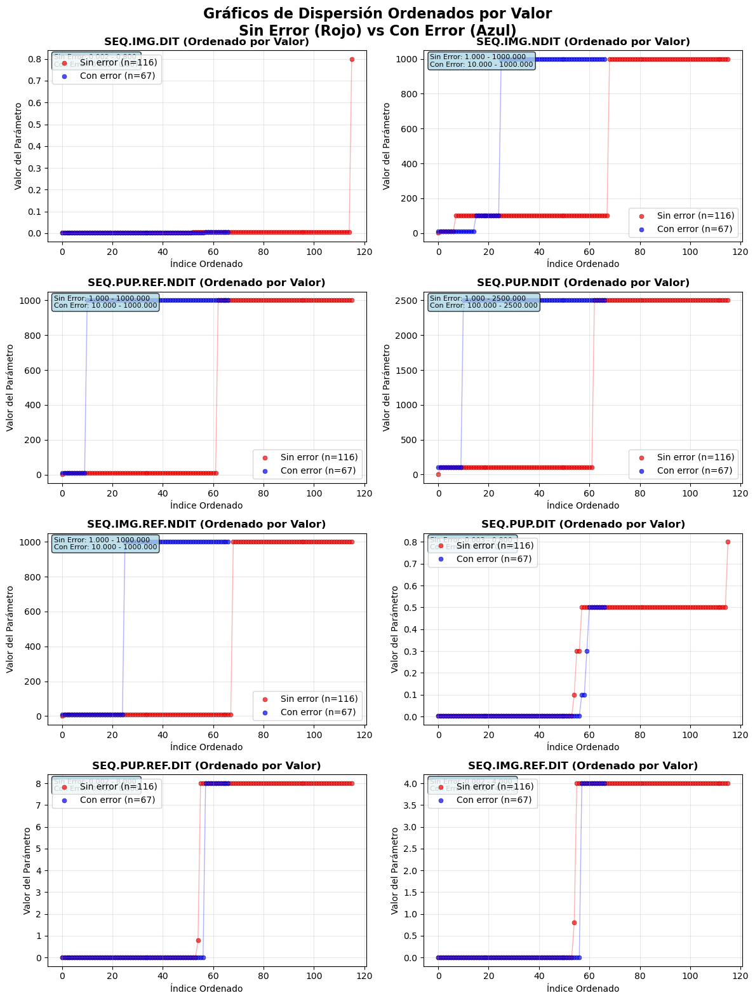


📊 Comparando: params_MATISSE_gen_tec_check_fringes.csv
Creando gráficos ordenados para 2 parámetros variables...


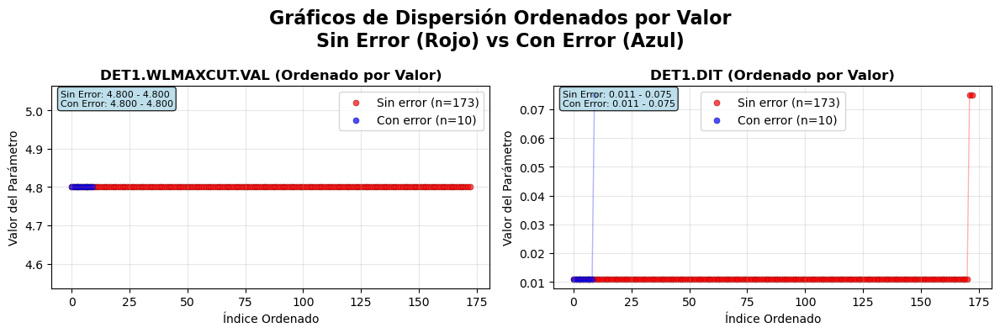


📊 Comparando: params_MATISSE_gen_tec_opd.csv
Creando gráficos ordenados para 9 parámetros variables...


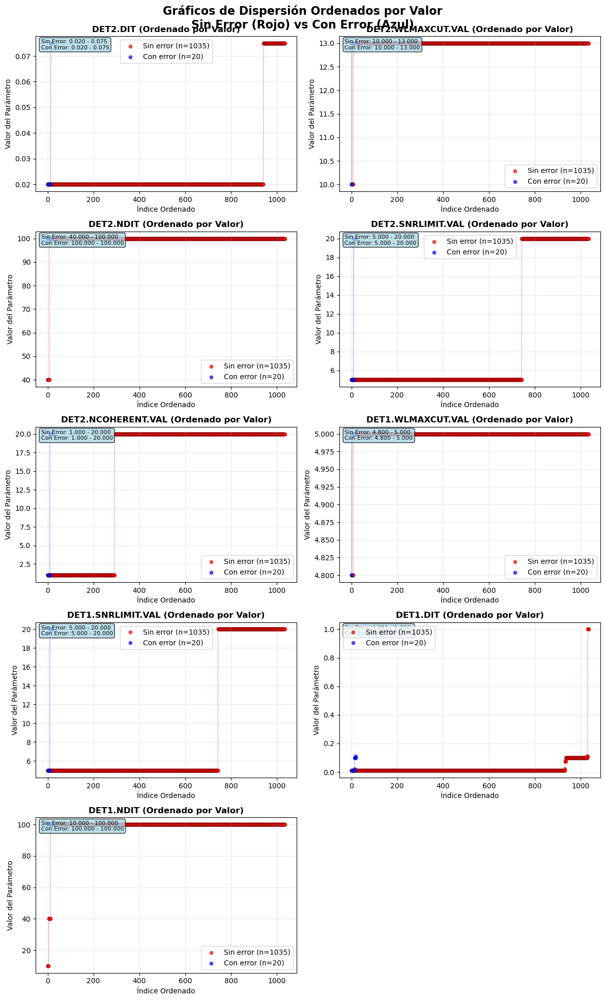


📊 Comparando: params_MATISSE_gen_tec_piezos.csv
Creando gráficos ordenados para 7 parámetros variables...


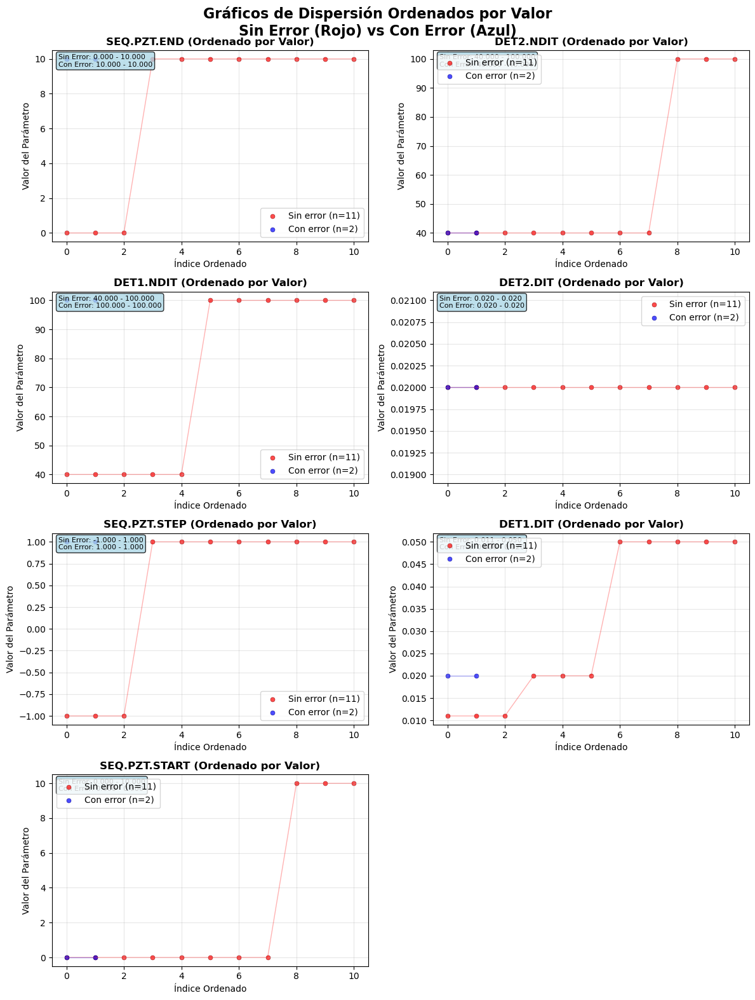


📊 Comparando: params_MATISSE_hyb_obs.csv
Creando gráficos ordenados para 17 parámetros variables...


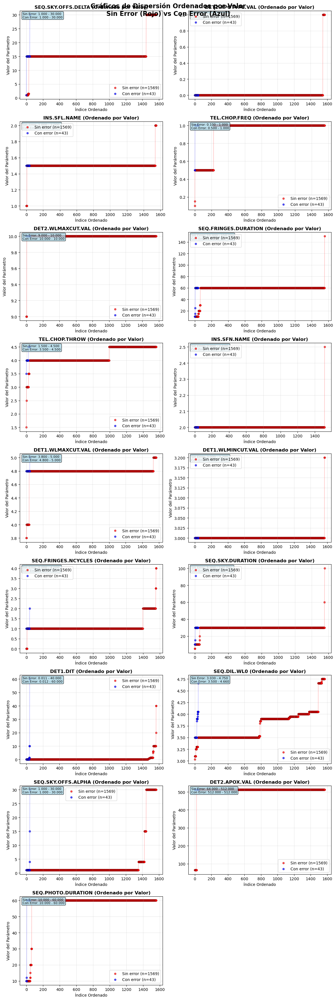


📊 Comparando: params_MATISSE_img_acq.csv
Creando gráficos ordenados para 27 parámetros variables...


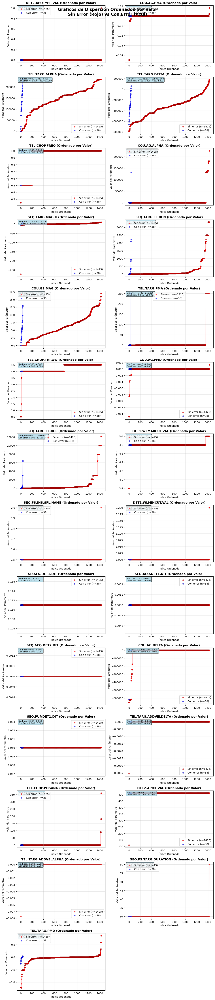


📊 Comparando: params_MATISSE_img_acq_ft.csv
Creando gráficos ordenados para 14 parámetros variables...


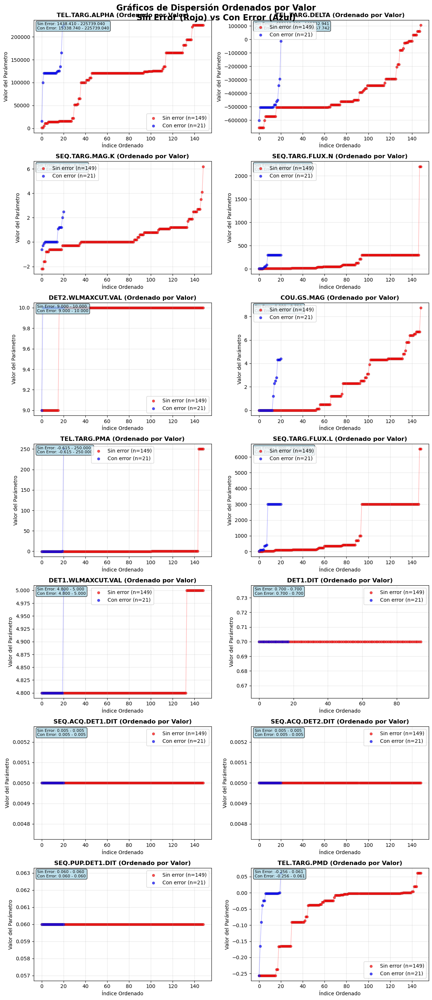

In [ ]:
import os
import pandas as pd

dir_ok = "params_por_tpl"
dir_err = "params_por_tpl_Error"

for filename in os.listdir(dir_ok):
    if filename.endswith(".csv"):
        path_ok = os.path.join(dir_ok, filename)
        path_err = os.path.join(dir_err, filename)

        if os.path.exists(path_err):
            print(f"\nComparando: {filename}")

            try:
                df_ok = pd.read_csv(path_ok, index_col=0)
                df_err = pd.read_csv(path_err, index_col=0)

                columnas_comunes = list(set(df_ok.columns) & set(df_err.columns))

                if not columnas_comunes:
                    print("⚠️ No hay columnas comunes para comparar.")
                    continue

                df_ok = df_ok[columnas_comunes]
                df_err = df_err[columnas_comunes]

                graficos_dispersion_ordenados_por_valor(df_ok, df_err)

            except Exception as e:
                print(f"Error al procesar {filename}: {e}")

        else:
            print(f"Archivo no encontrado en carpeta de errores: {filename}")
